# Spatial deconvolution with reference scRNA-seq

This notebook presents a fully reproducible workflow for spot-based spatial deconvolution using the unified API `omicverse.space.Deconvolution`, integrating Tangram and cell2location. It follows a Nature Protocol–style structure with clear purpose, inputs/outputs, parameters, timing, saving, and troubleshooting.

- Audience: Bioinformatics practitioners with basic Python/Scanpy familiarity.
- Data types: 10x Visium or similar spot-based spatial transcriptomics; a matched scRNA-seq reference from the same tissue/region.
- Outcomes: Spot-level cell-type composition/intensity maps, trained models for reuse, and publication-ready figures.

## Reproducible Environment (recommended)
- Python: ≥ 3.9 (3.10/3.11 recommended)
- omicverse: pinned to the version used in this notebook
- Key dependencies: scanpy, anndata, numpy, pandas, torch (GPU recommended for cell2location)
- Hardware: ≥ 16 GB RAM; a CUDA-capable GPU significantly speeds cell2location
- Reproducibility: set global random seeds (numpy/torch) and pin package versions.

## Inputs and Outputs
- Inputs:
  - scRNA-seq reference with clear cell-type annotations (gene IDs harmonized, preferably ENSEMBL)
  - Spatial transcriptomics counts (e.g., 10x Space Ranger outputs) from matched tissue/region
- Outputs:
  - Deconvolution matrices and cell-type spatial intensity/probability maps
  - Saved models/parameters for quick reload and reuse
  - Key figures: spatial heatmaps, multi-target overlays, local pie charts

## Workflow Overview with Estimated Timing
1. Prepare scRNA-seq reference (10–20 min)
2. Prepare spatial transcriptomics (10–20 min)
3. Tangram deconvolution: preprocess → fit → save/reuse (15–30 min)
4. cell2location: reference learning → spatial mapping → save/reuse (30–120 min; GPU faster)
5. Visualization and export (5–15 min)

Tip: Each step below documents purpose, inputs/outputs, and critical parameters to support reproducibility and adaptation to your data.


In [1]:
import squidpy as sq

import omicverse as ov
#print(f"omicverse version: {ov.__version__}")
import scanpy as sc
#print(f"scanpy version: {sc.__version__}")
ov.plot_set(font_path='Arial')

# Enable auto-reload for development
%load_ext autoreload
%autoreload 2

/home/groups/xiaojie/steorra/env/omicverse/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/groups/xiaojie/steorra/env/omicverse/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/groups/xiaojie/steorra/env/omicverse/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn

🔬 Starting plot initialization...
Using already downloaded Arial font from: /tmp/omicverse_arial.ttf


/home/groups/xiaojie/steorra/env/omicverse/lib/python3.10/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


Registered as: Arial
🧬 Detecting GPU devices…
✅ NVIDIA CUDA GPUs detected: 1
    • [CUDA 0] NVIDIA H100 80GB HBM3
      Memory: 79.1 GB | Compute: 9.0

   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

🔖 Version: 1.7.8rc1   📚 Tutorials: https://omicverse.readthedocs.io/
✅ plot_set complete.



## Step 1: Prepare the scRNA-seq reference (1 min)

Purpose: load and standardize the single-cell reference ensuring consistent cell-type annotations and harmonized gene IDs (prefer ENSEMBL).

- Inputs: public lymph node/spleen/tonsil scRNA-seq or your own dataset
- Outputs: `AnnData` object (`adata_ref`) with normalized variable names and cell-type annotations
- Key points:
  - The reference should cover major cell types/states expected in the spatial sample.
  - Harmonize gene IDs with the spatial data (ENSEMBL or symbols) to avoid failed mappings.



<Axes: title={'center': 'Subset'}, xlabel='X_umap1', ylabel='X_umap2'>

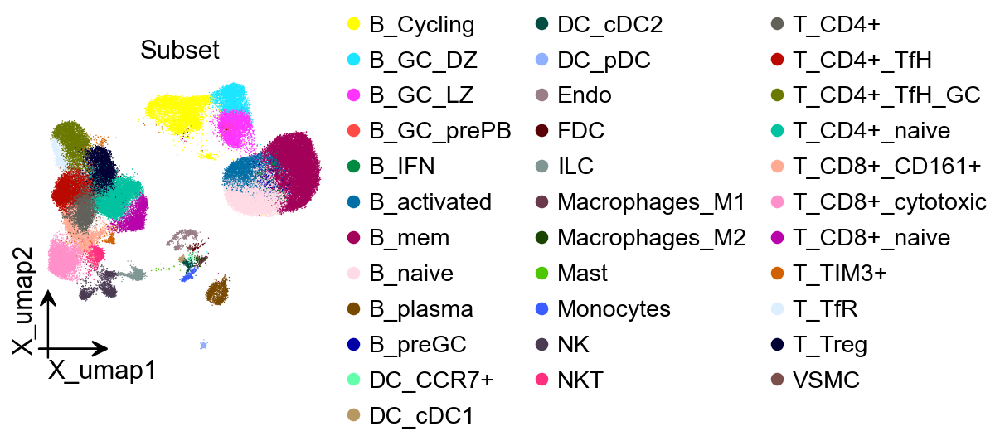

In [4]:
adata_sc=ov.read('data/sc.h5ad')
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(3,3))
ov.utils.embedding(
    adata_sc,
    basis="X_umap",
    color=['Subset'],
    title='Subset',
    frameon='small',
    #ncols=1,
    wspace=0.65,
    #palette=ov.utils.pyomic_palette()[11:],
    show=False,
    ax=ax
)

## Step 2: Prepare spatial transcriptomics (1 min)

Purpose: load 10x Visium (Space Ranger outputs) or similar to obtain a coordinate-aware spatial `AnnData` (`adata_sp`).

- Inputs: Visium count matrix and spatial coordinates (from the `spatial` folder)
- Outputs: `AnnData` object (`adata_sp`) with spot coordinates and counts
- Key points:
  - Ensure maximal gene overlap with the scRNA-seq reference; map gene IDs if necessary.
  - For multiple samples, keep batch labels explicit to support merging and visualization.



In [84]:
adata_sp = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata_sp.obs['sample'] = list(adata_sp.uns['spatial'].keys())[0]
adata_sp.var_names_make_unique()

reading /scratch/users/steorra/analysis/omic_test/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:00)


## Step 3: Tangram deconvolution (15–30 min)

Tangram maps scRNA-seq expression into spatial coordinates to infer cell-type distribution and proportions. We use `omicverse.space.Deconvolution` for a consistent interface.


In [85]:
decov_obj=ov.space.Deconvolution(
    adata_sc=adata_sc,
    adata_sp=adata_sp
)

### Step 3.1 Tangram preprocessing

Purpose: prepare scRNA-seq and spatial data with necessary filtering/transformations to enable robust fitting (prefer raw counts).


In [86]:
decov_obj.preprocess_sc(
    mode='shiftlog|pearson',n_HVGs=3000,target_sum=1e4,
)
decov_obj.preprocess_sp(
    mode='pearsonr',n_svgs=3000,target_sum=1e4,
)

🔍 [2025-09-20 03:25:56] Running preprocessing in 'cpu' mode...
Begin robust gene identification
    After filtration, 10237/10237 genes are kept.
    Among 10237 genes, 9838 genes are robust.
✅ Robust gene identification completed successfully.
Begin size normalization: shiftlog and HVGs selection pearson

🔍 Count Normalization:
   Target sum: 10000.0
   Exclude highly expressed: True
   Max fraction threshold: 0.2
   ⚠️ Excluding 17 highly-expressed genes from normalization computation

✅ Count Normalization Completed Successfully!
   ✓ Processed: 73,260 cells × 9,838 genes
   ✓ Runtime: 2.70s

🔍 Highly Variable Genes Selection (Experimental):
   Method: pearson_residuals
   Target genes: 3,000
   Theta (overdispersion): 100

✅ Experimental HVG Selection Completed Successfully!
   ✓ Selected: 3,000 highly variable genes out of 9,838 total (30.5%)
   ✓ Results added to AnnData object:
     • 'highly_variable': Boolean vector (adata.var)
     • 'highly_variable_rank': Float vector (adat

### Step 3.2 Run Tangram deconvolution (see above for I/O and parameters)


In [87]:
decov_obj.deconvolution(
    method='Tangram',celltype_key_sc='Subset',
    tangram_kwargs={'mode':'cells','num_epochs':500,'device':'cuda:0'}
)

tangram have been install version: 1.0.4
ranking genes
    finished: added to `.uns['Subset_rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)
...Calculate The Number of Markers: 1290
INFO:root:832 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1291 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
...Model prepared successfully
INFO:root:Allocate tensors for mapping.
INFO:roo

### Step 3.3 Save Tangram model and results (<1 min)

Recommended artifacts to save:
- Fitted mapping/probability matrices
- Core hyperparameters and software versions (for reproducibility)
- Result `AnnData`/`DataFrame` for downstream plotting



In [88]:
ov.utils.save(
    decov_obj.tangram_model,
    'result/model/tangram_model.pkl'
)

💾 Save Operation:
   Target path: result/model/tangram_model.pkl
   Object type: Tangram
   Using: pickle
   Pickle failed, switching to: cloudpickle
   ✅ Successfully saved using cloudpickle!
────────────────────────────────────────────────────────────


In [89]:
decov_obj.adata_sc.write(f"result/model/tangram_adata_sc.h5ad")
decov_obj.adata_sp.write(f"result/model/tangram_adata_sp.h5ad")

### Step 3.4 Result object: cell locations

In omicverse, cell location/intensity outputs are accessible via the `decov_obj` container (e.g., `decov_obj.adata_cell2location` or related fields). Check the actual attributes in your session for where Tangram exports are stored.


In [47]:
decov_obj.adata_cell2location

AnnData object with n_obs × n_vars = 4035 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'uniform_density', 'rna_count_based_density', 'T_CD4+_naive', 'DC_cDC1', 'T_TIM3+', 'Macrophages_M2', 'T_TfR', 'T_CD8+_naive', 'Endo', 'B_activated', 'T_CD8+_CD161+', 'T_CD4+_TfH', 'FDC', 'T_Treg', 'B_plasma', 'T_CD4+', 'B_GC_LZ', 'T_CD8+_cytotoxic', 'B_GC_DZ', 'VSMC', 'B_IFN', 'B_preGC', 'B_naive', 'Macrophages_M1', 'DC_CCR7+', 'B_mem', 'ILC', 'DC_cDC2', 'B_GC_prePB', 'Mast', 'DC_pDC', 'NKT', 'Monocytes', 'B_Cycling', 'T_CD4+_TfH_GC', 'NK'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_features', 'space_variable_features', 'highly_variable', 'sparsity'
    uns: 'spatial', 'log1p', 'hvg', 'status', 'status_args', 'REFERENCE_MANU', 'training_genes', 'overlap_genes'
    obsm: 'spatial', 'tangram_ct_pred'
    layers: 'counts'

### Step 3.5 Reuse: reload a saved Tangram model and impute

Purpose: skip retraining by loading a previously saved model/matrix and performing inference on the same or similar data.


In [9]:
decov_obj=ov.space.Deconvolution(
    adata_sc=ov.read(f"result/model/tangram_adata_sc.h5ad"),
    adata_sp=ov.read(f"result/model/tangram_adata_sp.h5ad")
)
decov_obj.load_tangram_model(
    'result/model/tangram_model.pkl'
)
decov_obj.tangram_inference()
decov_obj.impute(method='Tangram')
decov_obj.adata_impute

✓ Existing 'counts' layer in scRNA-seq data
✓ Existing 'counts' layer in spatial transcriptomics data
✓ spatial transcriptomics data is log-normalized by 1e4
⚠️ 1e4 is the standardized target sum for `scanpy`
✓ scRNA-seq data is log-normalized by 50*1e4
✓ spatial transcriptomics data is log-normalized by 50*1e4
⚠️ 50*1e4 is the standardized target sum for `omicverse`
📂 Load Operation:
   Source path: result/model/tangram_model.pkl
   Using: pickle
   ✅ Successfully loaded!
   Loaded object type: Tangram
────────────────────────────────────────────────────────────
✓ Tangram model is loaded
The Tangram model is saved in self.tangram
✓ Tangram is done
The Tangram result is saved in self.adata_cell2location
✓ Tangram impute is done
The impute result is saved in self.adata_impute


AnnData object with n_obs × n_vars = 4035 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'uniform_density', 'rna_count_based_density'
    var: 'GeneID-2', 'GeneName-2', 'feature_types', 'feature_types-0', 'feature_types-1', 'gene_ids-1', 'gene_ids-4861STDY7135913-0', 'gene_ids-4861STDY7135914-0', 'gene_ids-4861STDY7208412-0', 'gene_ids-4861STDY7208413-0', 'gene_ids-Human_colon_16S7255677-0', 'gene_ids-Human_colon_16S7255678-0', 'gene_ids-Human_colon_16S8000484-0', 'gene_ids-Pan_T7935494-0', 'genome-1', 'n_cells', 'nonz_mean', 'mean_cov_effect_Subset_B_Cycling', 'mean_cov_effect_Subset_B_GC_DZ', 'mean_cov_effect_Subset_B_GC_LZ', 'mean_cov_effect_Subset_B_GC_prePB', 'mean_cov_effect_Subset_B_IFN', 'mean_cov_effect_Subset_B_activated', 'mean_cov_effect_Subset_B_mem', 'mean_cov_effect_Subset_B_naive', 'mean_cov_effect_Subset_B_plasma', 'mean_cov_effect_Subset_B_preGC', 'mean_cov_effect_Subset_DC_CCR7+', 'mean_cov_effect_Subset_DC_cDC1', 'mean_cov_effect_Subset_DC_cDC2', '

In [94]:
decov_obj.adata_impute.uns=decov_obj.adata_sp.uns.copy()

In [97]:
decov_obj.adata_impute.obsm=decov_obj.adata_sp.obsm.copy()

Text(0.5, 1.0, 'Impute: MS4A1')

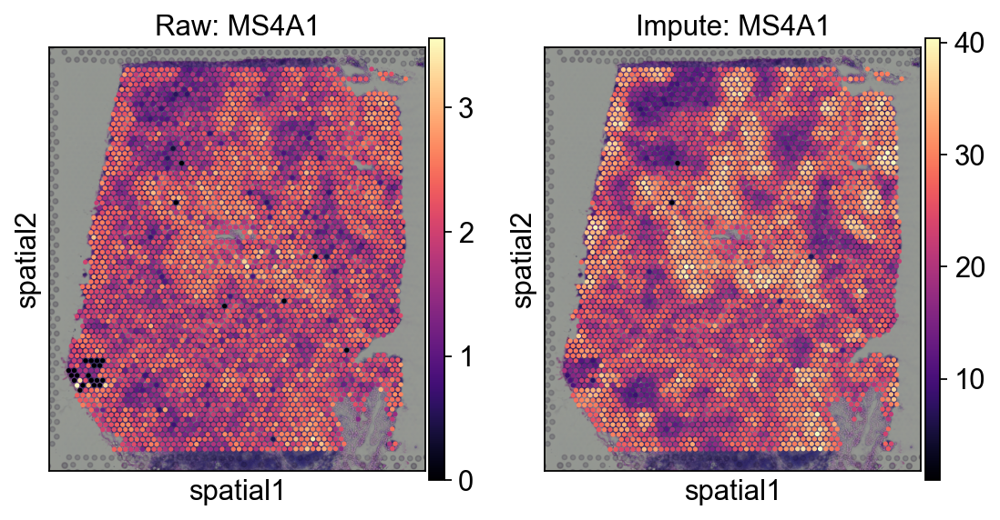

In [99]:
#fig = ov.plt.figure(figsize=(4, 4))
fig, axes = ov.plt.subplots(1,2,figsize=(8, 4))
sc.pl.spatial(
    decov_obj.adata_sp, 
    cmap='magma',
    color='MS4A1',
    ncols=4, size=1.3,ax=axes[0],
    img_key='hires',show=False,
)
axes[0].set_title('Raw: MS4A1')

sc.pl.spatial(
    decov_obj.adata_impute, 
    cmap='magma',
    color='ms4a1',
    ncols=4, size=1.3,ax=axes[1],
    img_key='hires',show=False,
)
axes[1].set_title('Impute: MS4A1')


## Step 4: cell2location deconvolution (30–120 min, GPU recommended)

cell2location is a Bayesian model that resolves fine-grained cell types in space. It typically proceeds in two stages:
1) learn reference signatures from scRNA-seq; 2) map those signatures to the spatial sample to estimate cell-type abundances.



In [2]:
adata_sc=ov.read('data/sc.h5ad')
adata_sp = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata_sp.obs['sample'] = list(adata_sp.uns['spatial'].keys())[0]
adata_sp.var_names_make_unique()

reading /scratch/users/steorra/analysis/omic_test/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:00)


In [3]:
decov_obj=ov.space.Deconvolution(
    adata_sc=adata_sc,
    adata_sp=adata_sp
)

### Step 4.1 Run Cell2location 

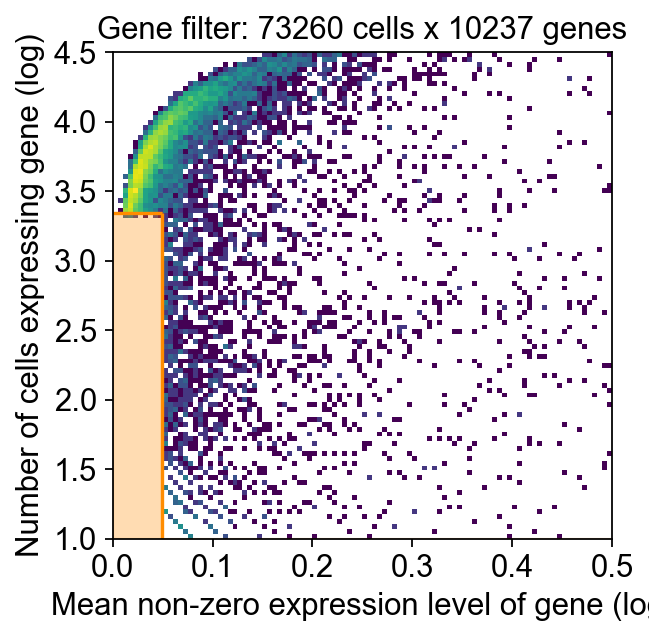

INFO: GPU available: True (cuda), used: True


INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True


INFO: TPU available: False, using: 0 TPU cores


INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores


INFO: HPU available: False, using: 0 HPUs


INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/200 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=200` reached.


INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


Sampling local variables, batch:   0%|          | 0/30 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

Total number of genes both in the scRNA-seq data and the spatial transcriptomics data: 10141


INFO: GPU available: True (cuda), used: True


INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True


INFO: TPU available: False, using: 0 TPU cores


INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores


INFO: HPU available: False, using: 0 HPUs


INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/20000 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=20000` reached.


INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20000` reached.


Sampling local variables, batch:   0%|          | 0/2 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

✓ cell2location is done
The cell2location result is saved in self.adata_cell2location


In [6]:
decov_obj.deconvolution(
    method='cell2location',celltype_key_sc='Subset',
    batch_key_sc=None,batch_key_sp='sample',
    cell2location_scrna_kwargs={'max_epochs':200,'batch_size':2500,'train_size':1,'lr':0.002},
    cell2location_spatial_kwargs={'max_epochs':20000,'batch_size':None,'train_size':1},
    sample_kwargs={"num_samples": 1000, "batch_size": 2500}
)

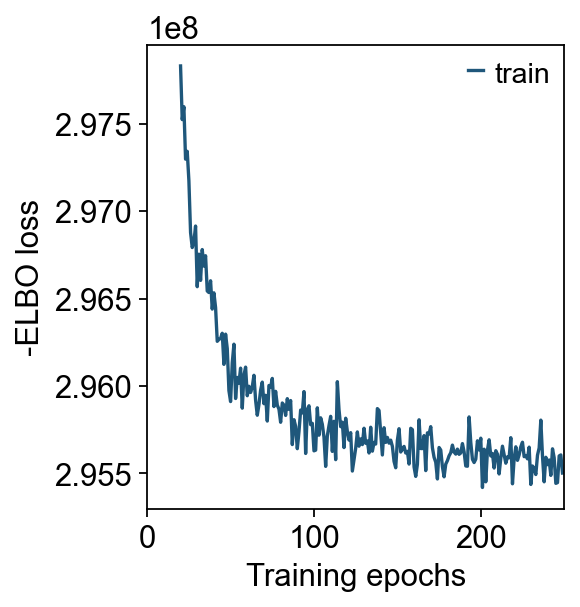

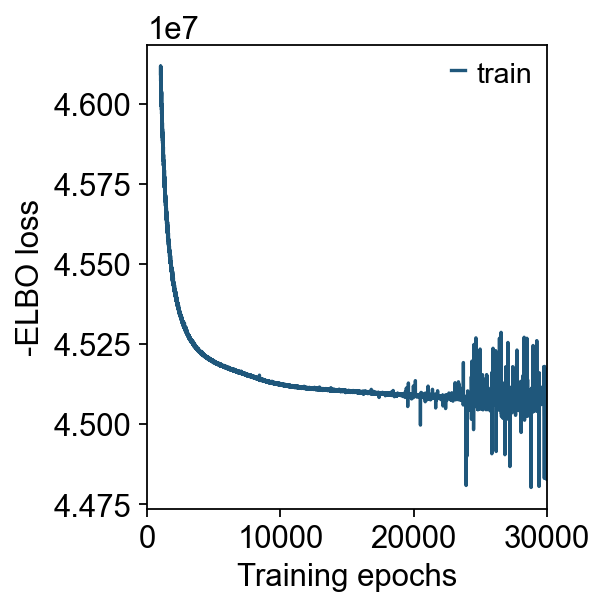

In [32]:
decov_obj.mod_sc.plot_history(20)
ov.plt.show()
decov_obj.mod_sp.plot_history(1000)

### Step 4.2 Spatial mapping and saving models (<1 min to save)

Recommended to save separately:
- Parameters/models from reference learning
- Parameters/models from spatial mapping
This minimizes repeated training costs in future runs.


In [7]:
# Save model
#ov.utils.save(decov_obj.mod_sc,f"result/model/reference_signatures.pkl")
# Save model
ov.utils.save(decov_obj.mod_sp,f"result/model/cell2location_map.pkl")

💾 Save Operation:
   Target path: result/model/reference_signatures.pkl
   Object type: RegressionModel
   Using: pickle
   Pickle failed, switching to: cloudpickle
   ✅ Successfully saved using cloudpickle!
────────────────────────────────────────────────────────────
💾 Save Operation:
   Target path: result/model/cell2location_map.pkl
   Object type: Cell2location
   Using: pickle
   Pickle failed, switching to: cloudpickle
   ✅ Successfully saved using cloudpickle!
────────────────────────────────────────────────────────────


In [8]:
decov_obj.adata_sc.write(f"result/model/cell2location_adata_sc.h5ad")
decov_obj.adata_sp.write(f"result/model/cell2location_adata_sp.h5ad")

### Step 4.3 Result object: cell locations (cell2location)


In [35]:
decov_obj.adata_cell2location

AnnData object with n_obs × n_vars = 4035 × 34
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels'
    uns: 'spatial', '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'prop_celltypes'

### Step 4.4 Reuse: reload models and perform imputation


In [19]:
decov_obj=ov.space.Deconvolution(
    adata_sc=ov.read(f"result/model/cell2location_adata_sc.h5ad"),
    adata_sp=ov.read(f"result/model/cell2location_adata_sp.h5ad"),
)
decov_obj.load_cell2location_model(
    mod_sp_path=f"result/model/cell2location_map.pkl"
)
decov_obj.cell2location_inference()
decov_obj.impute(method='cell2location')
decov_obj.adata_sp

📂 Load Operation:
   Source path: result/model/cell2location_map.pkl
   Using: pickle
   ✅ Successfully loaded!
   Loaded object type: Cell2location
────────────────────────────────────────────────────────────
✓ cell2location model is loaded
The cell2location model is saved in self.mod_sc and self.mod_sp
INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        


Sampling local variables, batch:   0%|          | 0/2 [00:00<?, ?it/s]

Sampling global variables, sample:   0%|          | 0/999 [00:00<?, ?it/s]

✓ cell2location is done
The cell2location result is saved in self.adata_cell2location
✓ cell2location impute is done
Compare with the tangram impute result, cell2location's impute stores in self.adata_sp.layers


AnnData object with n_obs × n_vars = 4035 × 10141
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', '_indices', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'spatial'
    obsm: 'means_cell_abundance_w_sf', 'prop_celltypes', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'
    layers: 'B_Cycling', 'B_GC_DZ', 'B_GC_LZ', 'B_GC_prePB', 'B_IFN', 'B_activated', 'B_mem', 'B_naive', 'B_plasma', 'B_preGC', 'DC_CCR7+', 'DC_cDC1', 'DC_cDC2', 'DC_pDC', 'Endo', 'FDC', 'ILC', 'Macrophages_M1', 'Macrophages_M2', 'Mast', 'Monocytes', 'NK', 'NKT', 'T_CD4+', 'T_CD4+_TfH', 'T_CD4+_TfH_GC', 'T_CD4+_naive', 'T_CD8+_CD161+', 'T_CD8+_cytotoxic', 'T_CD8+_naive', 'T_TIM3+', 'T_TfR', 'T_Treg', 'VSMC'

Text(0.5, 1.0, 'B_naive Impute: MS4A1')

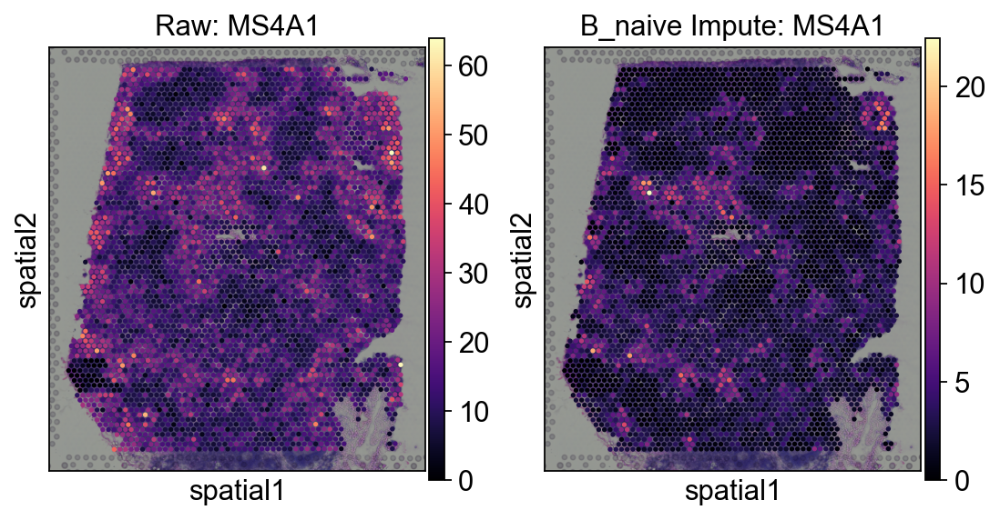

In [22]:
#fig = ov.plt.figure(figsize=(4, 4))
fig, axes = ov.plt.subplots(1,2,figsize=(8, 4))
sc.pl.spatial(
    decov_obj.adata_sp, 
    cmap='magma',
    color='MS4A1',
    ncols=4, size=1.3,ax=axes[0],
    img_key='hires',show=False,
)
axes[0].set_title('Raw: MS4A1')

sc.pl.spatial(
    decov_obj.adata_sp, 
    layer='B_naive',
    cmap='magma',
    color='MS4A1',
    ncols=4, size=1.3,ax=axes[1],
    img_key='hires',show=False,
)
axes[1].set_title('B_naive Impute: MS4A1')


## Step 5: Visualization (5–15 min)

We provide multiple views: single-target spatial heatmaps, multi-target overlays, and local pie charts. Start with global inspection, then zoom into biologically relevant regions for higher-resolution assessment.

### 5.1 Spatial value dotplot 

#### 5.1.1 Tangram

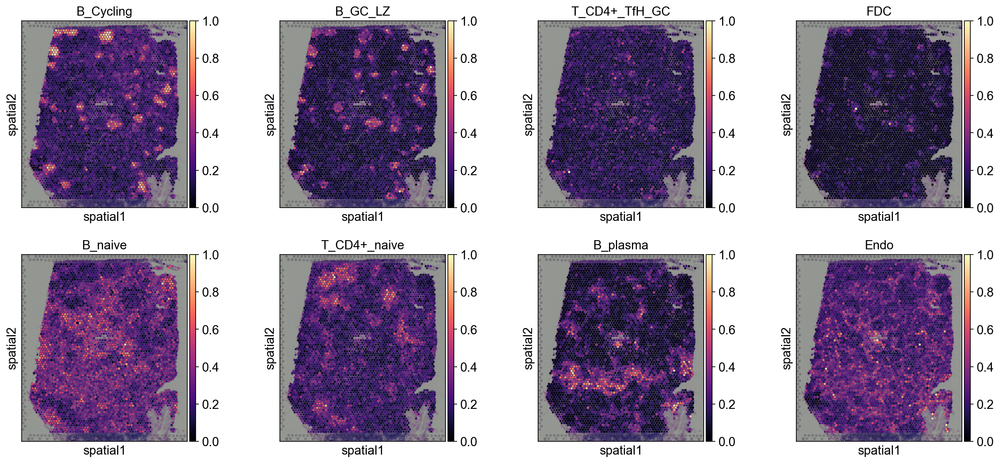

In [10]:
annotation_list=['B_Cycling', 'B_GC_LZ', 'T_CD4+_TfH_GC', 'FDC',
                'B_naive', 'T_CD4+_naive', 'B_plasma', 'Endo']
sc.pl.spatial(
    decov_obj.adata_cell2location, 
    cmap='magma',
    # show first 8 cell types
    color=annotation_list,
    ncols=4, size=1.3,
    img_key='hires',
    # limit color scale at 99.2% quantile of cell abundance
    #vmin=0, vmax='p99.2'
)

#### 5.1.2 cell2location


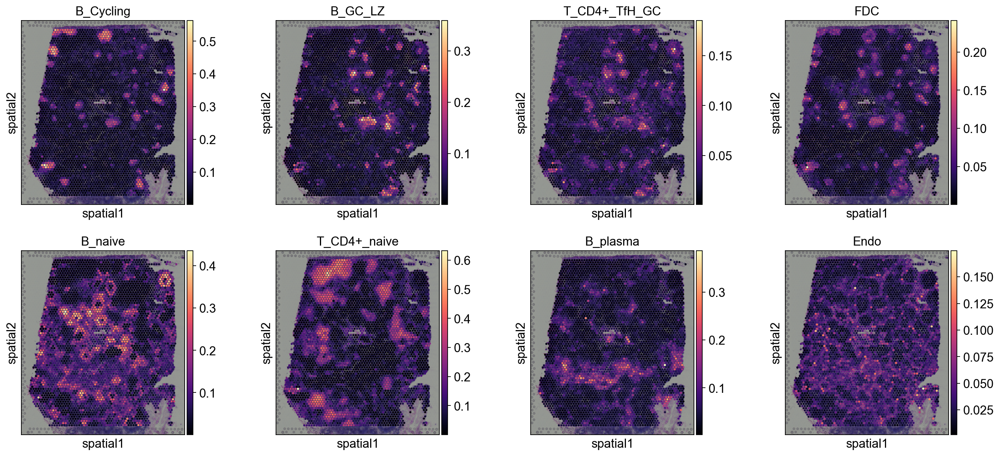

In [23]:
annotation_list=['B_Cycling', 'B_GC_LZ', 'T_CD4+_TfH_GC', 'FDC',
                'B_naive', 'T_CD4+_naive', 'B_plasma', 'Endo']
sc.pl.spatial(
    decov_obj.adata_cell2location, 
    cmap='magma',
    # show first 8 cell types
    color=annotation_list,
    ncols=4, size=1.3,
    img_key='hires',
    # limit color scale at 99.2% quantile of cell abundance
    #vmin=0, vmax='p99.2'
)

### 5.2 Multi-target overlay


In [24]:
color_dict=dict(zip(adata_sc.obs['Subset'].cat.categories,
                   adata_sc.uns['Subset_colors']))

#### 5.2.1 Tangram


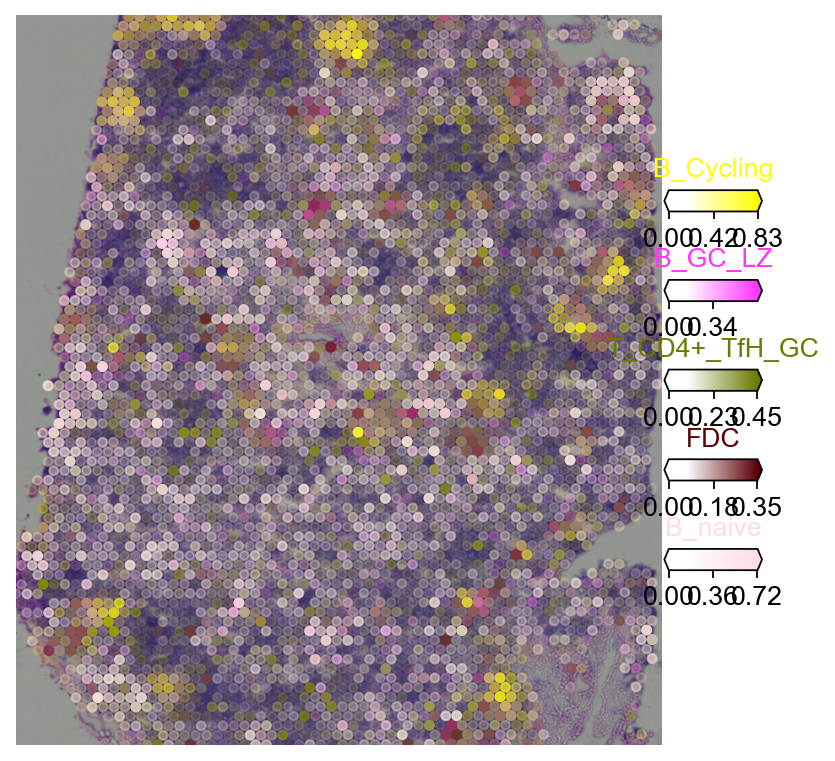

In [11]:
import matplotlib as mpl
clust_labels = annotation_list[:5]
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

with mpl.rc_context({'figure.figsize': (6, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=decov_obj.adata_cell2location,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=4,
        reorder_cmap = [#0,
            1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right',
        palette=color_dict
    )
    

#### 5.2.2 cell2location


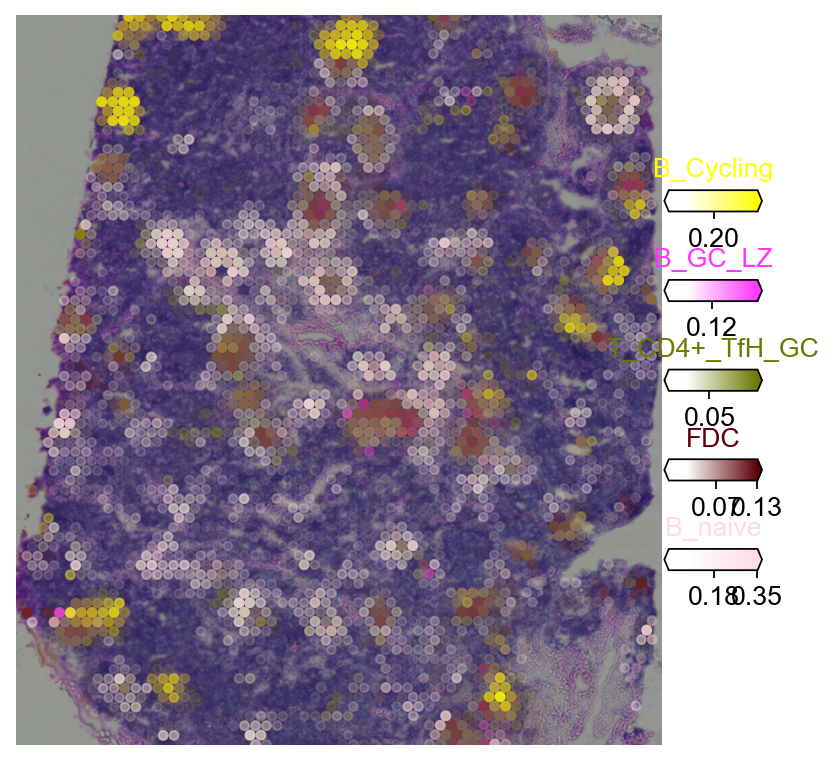

In [31]:
import matplotlib as mpl
clust_labels = annotation_list[:5]
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

with mpl.rc_context({'figure.figsize': (6, 6),'axes.grid': False}):
    fig = ov.pl.plot_spatial(
        adata=decov_obj.adata_cell2location,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=4,
        reorder_cmap = [#0,
            1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right',
        palette=color_dict
    )
    

### 5.3 Pie plot

We recommend cropping a region of interest before plotting to avoid overly dense pie charts on whole slides.


In [32]:
adata_s = ov.space.crop_space_visium(
    decov_obj.adata_cell2location, 
    crop_loc=(0, 0),      
    crop_area=(500, 1000), 
    library_id=list(decov_obj.adata_cell2location.uns['spatial'].keys())[0] , 
    scale=1
)

Adding image layer `image`


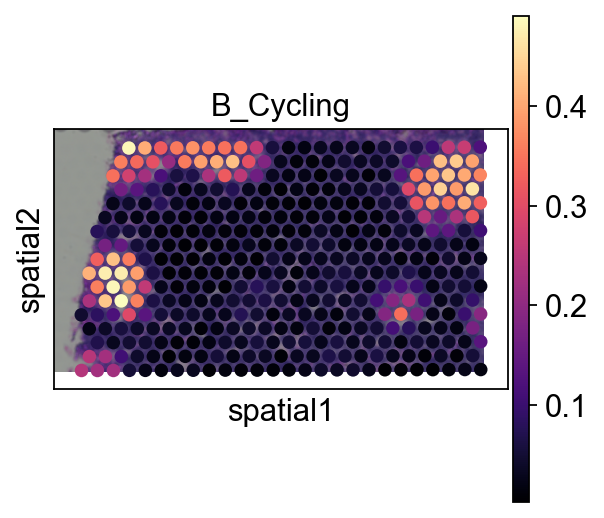

In [33]:
sc.pl.spatial(adata_s, cmap='magma',
                  # show first 8 cell types
                  color=annotation_list[0],
                  ncols=4, size=1.3,
                  img_key='hires',
                  # limit color scale at 99.2% quantile of cell abundance
                  #vmin=0, vmax='p99.2'
                 )

In [5]:
color_dict=dict(zip(adata_sc.obs['Subset'].cat.categories,
                   adata_sc.uns['Subset_colors']))

#### 5.3.1 Tangram



00%|██████████| 417/417 [00:01<00:00, 213.51it/s]

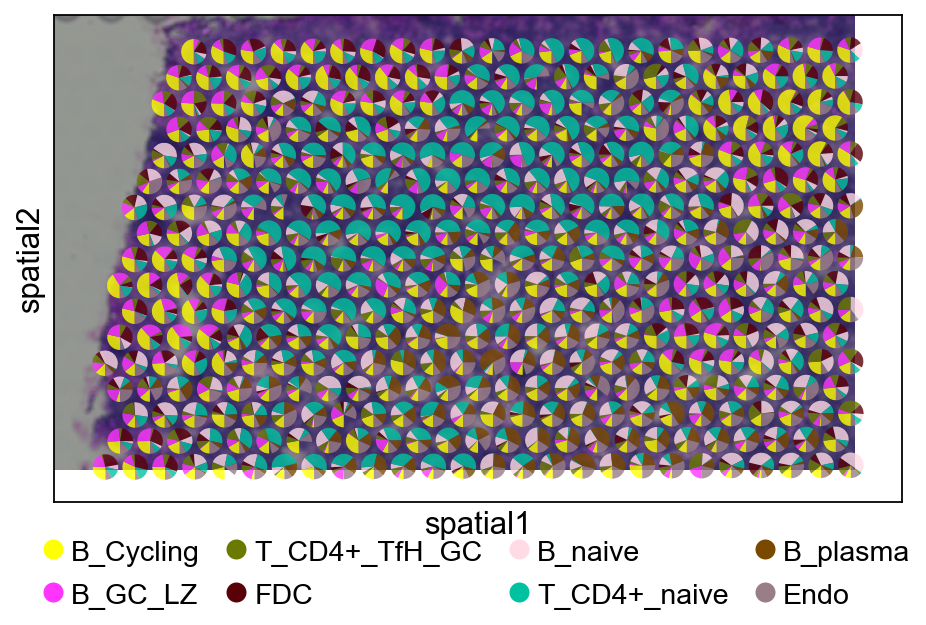

In [24]:
fig, ax = plt.subplots(figsize=(8, 4))
sc.pl.spatial(
    adata_s, 
    basis='spatial',
    color=None,  
    size=1.3,
    img_key='hires',
    ax=ax,      
    show=False
)

ov.pl.add_pie2spatial(
    adata_s,
    img_key='hires',
    cell_type_columns=annotation_list[:],
    ax=ax,
    colors=color_dict,
    pie_radius=10,
    remainder='gap',
    legend_loc=(0.5, -0.25),
    ncols=4,
    alpha=0.8
)

plt.show()

#### 5.3.2 cell2location



00%|██████████| 417/417 [00:01<00:00, 258.98it/s]

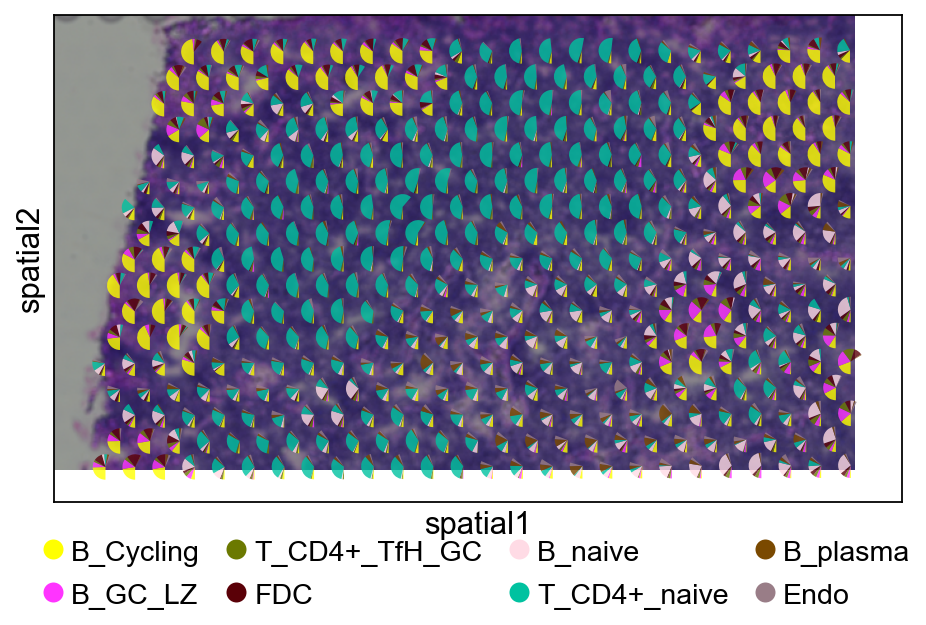

In [7]:
fig, ax = plt.subplots(figsize=(8, 4))
sc.pl.spatial(
    adata_s, 
    basis='spatial',
    color=None,  
    size=1.3,
    img_key='hires',
    ax=ax,      
    show=False
)

ov.pl.add_pie2spatial(
    adata_s,
    img_key='hires',
    cell_type_columns=annotation_list[:],
    ax=ax,
    colors=color_dict,
    pie_radius=10,
    remainder='gap',
    legend_loc=(0.5, -0.25),
    ncols=4,
    alpha=0.8
)

plt.show()

## Extensions and Further Reading

- cell2location official tutorials and docs: https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html
- Tangram paper and documentation: consult official resources for advanced parameters and updates.
- Reproducibility tip: record `omicverse` and dependency versions in your project for consistent results across the team.



In [16]:
from omicverse.external.space.cell2location.models import Cell2location, RegressionModel
from omicverse.external.space.cell2location.plt import plot_spatial
from omicverse.external.space.cell2location.utils import select_slide
from omicverse.external.space.cell2location.utils.filtering import filter_genes

## Citations and Acknowledgements

Please cite:
- OmicVerse toolkit (this notebook’s implementation)
- Tangram: original publication and software
- cell2location: original publication and software
- The datasets used (scRNA-seq reference and spatial transcriptomics)

We thank the original tool authors and dataset providers for making their resources available to the community.


In [ ]:
import tangram as tg

## Troubleshooting

- Gene ID mismatch:
  - Symptom: many NaNs or empty outputs; very few overlapping genes.
  - Fix: harmonize gene IDs between scRNA-seq and spatial data (ENSEMBL/symbols), drop non-overlapping genes and log counts.
- Reference coverage insufficient:
  - Symptom: expected cell types missing in known tissue regions.
  - Fix: augment the scRNA-seq reference with tissue/age/pathology-matched data; integrate multiple sources and correct batch effects.
- Hyperparameters:
  - Tangram: pay attention to regularization and gene selection; small grid search can help.
  - cell2location: prefer GPU; adjust training epochs/priors to dataset size; monitor convergence diagnostics.
- Reproducibility:
  - Fix random seeds and package versions; save models and key intermediate artifacts; record environment details at the top of the notebook.
